Fetching Sentinel-2 for BBox: (-120.17663301540155, 34.93978004632679, -120.14968355687797, 34.96186900879866)
<xarray.Dataset> Size: 173MB
Dimensions:      (time: 42, y: 253, x: 254)
Coordinates:
  * time         (time) datetime64[us] 336B 2023-03-02T18:43:09.025000 ... 20...
  * y            (y) float64 2kB 3.873e+06 3.873e+06 ... 3.87e+06 3.87e+06
  * x            (x) float64 2kB 7.578e+05 7.578e+05 ... 7.603e+05 7.603e+05
    spatial_ref  int32 4B 32610
Data variables: (12/16)
    AOT          (time, y, x) float32 11MB dask.array<chunksize=(1, 253, 254), meta=np.ndarray>
    B01          (time, y, x) float32 11MB dask.array<chunksize=(1, 253, 254), meta=np.ndarray>
    B02          (time, y, x) float32 11MB dask.array<chunksize=(1, 253, 254), meta=np.ndarray>
    B03          (time, y, x) float32 11MB dask.array<chunksize=(1, 253, 254), meta=np.ndarray>
    B04          (time, y, x) float32 11MB dask.array<chunksize=(1, 253, 254), meta=np.ndarray>
    B05          (time, y, x) floa

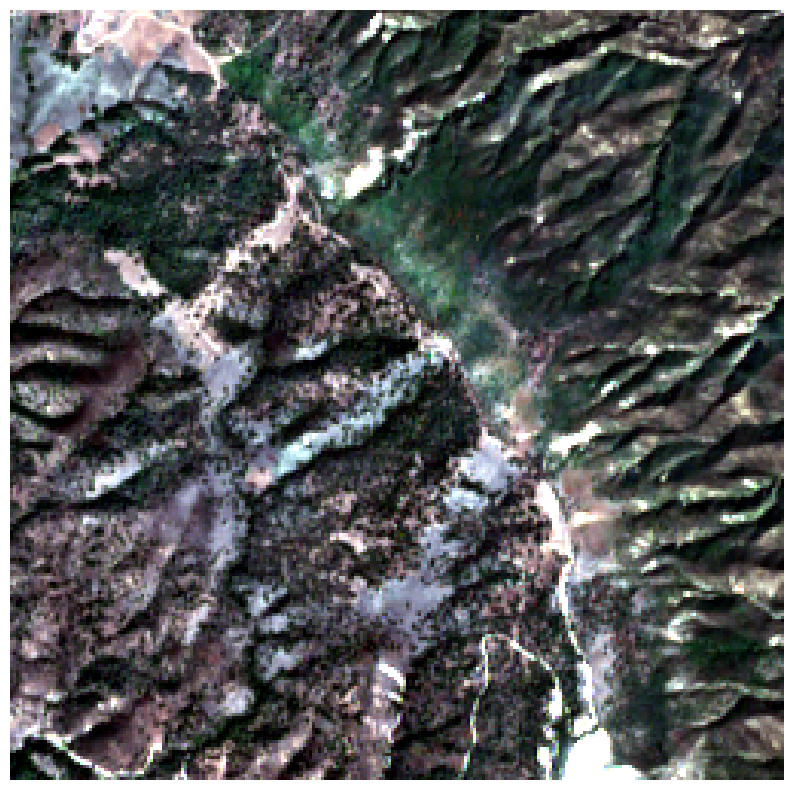

<Figure size 640x480 with 0 Axes>

In [28]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, box

from mapminer import miners
miner = miners.Sentinel2Miner()

def get_sentinel_from_coord(lat, lon, radius_meters=1000, year=2023):
    # 1. Generate the Polygon/BBox from Lat/Lon
    # We project to 3857 to use meters for the radius
    point_gdf = gpd.GeoDataFrame(geometry=[Point(lon, lat)], crs="EPSG:4326")
    point_projected = point_gdf.to_crs(epsg=3857)
    
    # Create the buffer and get its bounds to make a clean square BBox
    buffer_geom = point_projected.buffer(radius_meters).to_crs(epsg=4326).iloc[0]
    bbox = buffer_geom.bounds # (minx, miny, maxx, maxy)
    
    print(f"Fetching Sentinel-2 for BBox: {bbox}")

    # 2. Fetch from Miner
    # Note: We use the polygon/bbox directly for better coverage
    ds = miner.fetch(polygon=buffer_geom, daterange=f"{year}-03-01/{year}-09-30")

    print(ds)

    cloud_pct = ds.attrs.get('eo:cloud_cover', 'Unknown')
    print(f"Cloud Cover: {cloud_pct}%")
    
    if ds is None:
        print("No data found.")
        return None

    # 3. Extract RGB and Normalize
    # Selecting Red (B04), Green (B03), and Blue (B02)
    rgb = xr.concat([ds[b].isel(time=-1) for b in ['B04', 'B03', 'B02']], dim='band')
    rgb['band'] = ['red', 'green', 'blue']
    
    # Simple 2% - 98% percentile stretch for a "natural" look
    data = rgb.compute().values.astype("float32")
    for i in range(3):
        low, high = np.nanpercentile(data[i], [2, 98])
        data[i] = np.clip((data[i] - low) / (high - low), 0, 1)
    
    # 4. Display
    plt.figure(figsize=(10, 10))
    plt.imshow(data.transpose(1, 2, 0)) # Transpose to (H, W, C)
    # plt.title(f"Sentinel-2: {lat}, {lon} ({radius_meters}m radius)")
    plt.axis('off')
    plt.show()

    output_filename = 'sentinel2_output.png'
    plt.savefig(output_filename, dpi=300, bbox_inches='tight', pad_inches=0)

    return data

# Example: NYC Central Park
img = get_sentinel_from_coord(34.9508252715598, -120.16315828613976, radius_meters=1500)

In [12]:
import PIL

img=PIL.Image.open("output3.png")
print(img)

<PIL.PngImagePlugin.PngImageFile image mode=RGBA size=794x788 at 0x7C28D194F9D0>


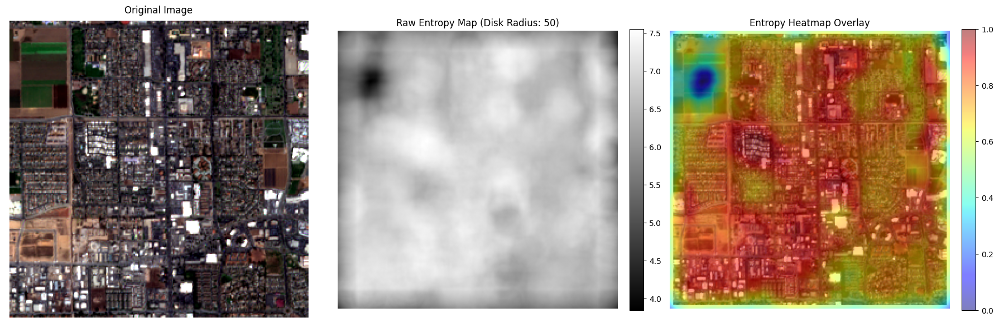

In [21]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters.rank import entropy
from skimage.morphology import disk


def plot_entropy_heatmap(image_path, disk_radius=5, alpha=0.6, cmap="jet"):
    """Computes a local entropy filter on an image and overlays it as a heatmap.

    Parameters:
    -----------
    image_path : str
        Path to the input image.
    disk_radius : int
        The radius of the circular neighborhood (structuring element) used
        to calculate entropy. Larger values capture broader texture context.
    alpha : float
        Blending factor for the overlay. 0.0 is pure original image,
        1.0 is pure heatmap.
    cmap : str
        The matplotlib colormap to use for the heatmap (e.g., 'jet', 'inferno',
        'viridis').
    """
    # 1. Load the original image
    # Read as BGR and convert to RGB for proper matplotlib display
    bgr_img = cv2.imread(image_path)
    if bgr_img is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)

    # 2. Convert to grayscale for entropy calculation
    gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

    # 3. Define the neighborhood and compute local entropy
    # skimage's entropy requires a structuring element (we use a disk)
    footprint = disk(disk_radius)
    entropy_map = entropy(gray_img, footprint)

    # 4. Normalize the entropy map to 0-1 for visualization
    entropy_min, entropy_max = entropy_map.min(), entropy_map.max()
    if entropy_max > entropy_min:
        norm_entropy = (entropy_map - entropy_min) / (entropy_max - entropy_min)
    else:
        norm_entropy = np.zeros_like(entropy_map, dtype=np.float32)

    # 5. Plotting the results
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot 1: Original Image
    axes[0].imshow(rgb_img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Plot 2: Raw Entropy Map
    # High entropy areas will appear bright/white
    im1 = axes[1].imshow(entropy_map, cmap="gray")
    axes[1].set_title(f"Raw Entropy Map (Disk Radius: {disk_radius})")
    axes[1].axis("off")
    fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # Plot 3: Heatmap Overlay
    # First show the base image
    axes[2].imshow(rgb_img)
    # Overlay the normalized entropy map with an alpha channel and a colormap
    im2 = axes[2].imshow(norm_entropy, cmap=cmap, alpha=alpha)
    axes[2].set_title("Entropy Heatmap Overlay")
    axes[2].axis("off")
    fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


# Example Usage:
plot_entropy_heatmap('output3.png', disk_radius=50, alpha=0.5)

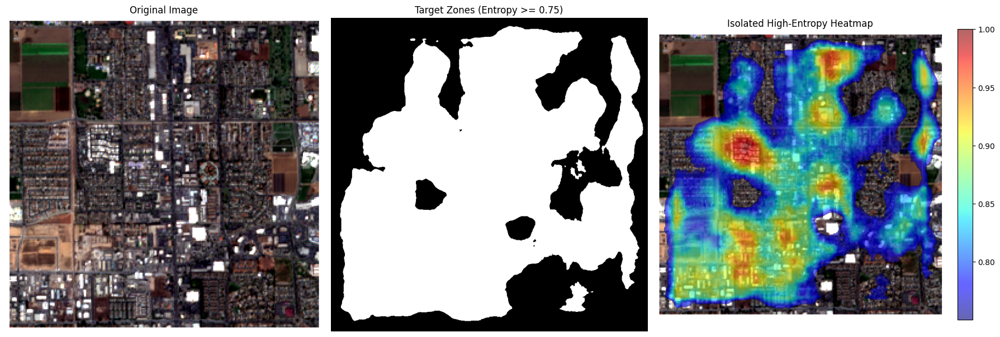

In [24]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters.rank import entropy
from skimage.morphology import disk


def plot_entropy_heatmap(
    image_path, disk_radius=5, entropy_threshold=0.7, alpha=0.6, cmap="jet"
):
    """Computes a local entropy filter on an image and overlays a heatmap

    strictly on areas that exceed a specified entropy threshold.

    Parameters:
    -----------
    image_path : str
        Path to the input image.
    disk_radius : int
        The radius of the circular neighborhood used to calculate entropy.
    entropy_threshold : float
        Value between 0.0 and 1.0. Only regions with normalized entropy
        at or above this threshold will be highlighted.
    alpha : float
        Blending factor for the overlay.
    cmap : str
        The matplotlib colormap to use for the heatmap.
    """
    # 1. Load the original image
    bgr_img = cv2.imread(image_path)
    if bgr_img is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)

    # 2. Convert to grayscale for entropy calculation
    gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

    # 3. Compute local entropy
    footprint = disk(disk_radius)
    entropy_map = entropy(gray_img, footprint)

    # 4. Normalize the entropy map to 0-1
    entropy_min, entropy_max = entropy_map.min(), entropy_map.max()
    if entropy_max > entropy_min:
        norm_entropy = (entropy_map - entropy_min) / (entropy_max - entropy_min)
    else:
        norm_entropy = np.zeros_like(entropy_map, dtype=np.float32)

    # --- THRESHOLD FILTERING LOGIC ---
    # Create a copy of the normalized map to mask out low-entropy values
    thresholded_entropy = norm_entropy.copy()
    # Mask out areas below the threshold by setting them to NaN (transparent)
    thresholded_entropy[thresholded_entropy < entropy_threshold] = np.nan
    # ---------------------------------

    # 5. Plotting the results
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot 1: Original Image
    axes[0].imshow(rgb_img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Plot 2: Binary Mask showing targeted areas
    binary_mask = norm_entropy >= entropy_threshold
    axes[1].imshow(binary_mask, cmap="gray")
    axes[1].set_title(f"Target Zones (Entropy >= {entropy_threshold})")
    axes[1].axis("off")

    # Plot 3: Thresholded Heatmap Overlay
    axes[2].imshow(rgb_img)
    # Matplotlib ignores NaN values when plotting, keeping the base image clear
    im2 = axes[2].imshow(thresholded_entropy, cmap=cmap, alpha=alpha)
    axes[2].set_title("Isolated High-Entropy Heatmap")
    axes[2].axis("off")
    fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


# Example Usage:
# Since you increased disk_radius to 50 for a broad structural view,
# a threshold of 0.6 or 0.7 will accurately isolate the most complex clusters.
plot_entropy_heatmap(
    "output3.png", disk_radius=50, entropy_threshold=0.75, alpha=0.6, cmap="jet"
)

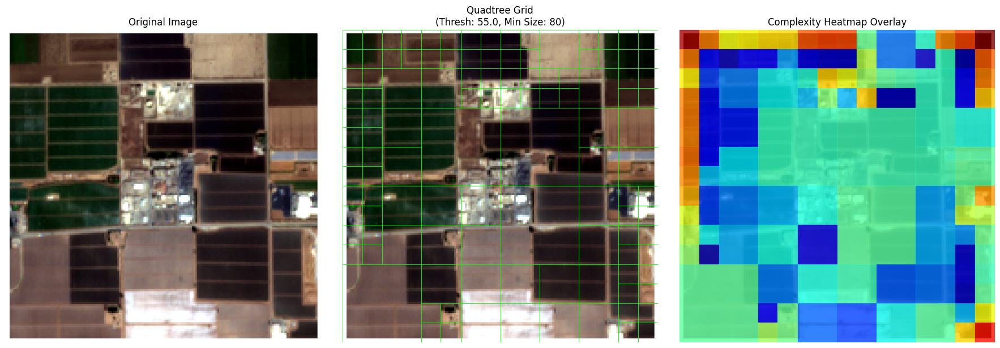

In [35]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


def quadtree_decompose(img_gray, x, y, width, height, threshold, min_size):
    """Recursively splits the image into quadrants based on texture variation (standard deviation)."""
    # Extract the current block
    block = img_gray[y : y + height, x : x + width]

    # Calculate standard deviation as a proxy for local entropy/complexity
    std_dev = np.std(block)

    # Base case: if block is uniform enough OR too small to split further
    if std_dev < threshold or width <= min_size or height <= min_size:
        return [(x, y, width, height, std_dev)]

    # Otherwise, split into 4 quadrants
    w_half = width // 2
    h_half = height // 2

    # Handle odd dimensions gracefully
    w_rem = width - w_half
    h_rem = height - h_half

    quadrants = []
    # Top-Left, Top-Right, Bottom-Left, Bottom-Right
    quadrants.extend(
        quadtree_decompose(img_gray, x, y, w_half, h_half, threshold, min_size)
    )
    quadrants.extend(
        quadtree_decompose(
            img_gray, x + w_half, y, w_rem, h_half, threshold, min_size
        )
    )
    quadrants.extend(
        quadtree_decompose(
            img_gray, x, y + h_half, w_half, h_rem, threshold, min_size
        )
    )
    quadrants.extend(
        quadtree_decompose(
            img_gray, x + w_half, y + h_half, w_rem, h_rem, threshold, min_size
        )
    )

    return quadrants


def plot_quadtree_decomposition(
    image_path, threshold=15.0, min_size=8, alpha=0.4
):
    """Performs quadtree decomposition on an image and overlays the resulting

    grid map to highlight areas of high spatial complexity.

    Parameters:
    -----------
    image_path : str
        Path to the input image.
    threshold : float
        Standard deviation threshold. Lower values force more splitting
        (higher sensitivity to texture).
    min_size : int
        The minimum pixel size (width/height) a block can be split down to.
    alpha : float
        Transparency overlay behavior for the block filling.
    """
    # 1. Load the original image
    bgr_img = cv2.imread(image_path)
    if bgr_img is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
    gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

    h, w = gray_img.shape

    # 2. Compute Quadtree Decomposition
    blocks = quadtree_decompose(
        gray_img, 0, 0, w, h, threshold=threshold, min_size=min_size
    )

    # 3. Setup plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot 1: Original Image
    axes[0].imshow(rgb_img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Plot 2: Quadtree Grid Wireframe
    axes[1].imshow(rgb_img)
    axes[1].set_title(
        f"Quadtree Grid\n(Thresh: {threshold}, Min Size: {min_size})"
    )
    axes[1].axis("off")

    for x, y, width, height, _ in blocks:
        rect = patches.Rectangle(
            (x, y),
            width,
            height,
            linewidth=0.5,
            edgecolor="lime",
            facecolor="none",
        )
        axes[1].add_patch(rect)

    # Plot 3: Heatmap Overlay (Dense small blocks = High Entropy)
    axes[2].imshow(rgb_img)
    axes[2].set_title("Complexity Heatmap Overlay")
    axes[2].axis("off")

    # Find max std dev to normalize color rendering
    max_std = max([b[4] for b in blocks]) if blocks else 1.0

    # Draw color-filled blocks based on normalized variance/entropy
    for x, y, width, height, std_dev in blocks:
        norm_val = std_dev / max_std if max_std > 0 else 0
        # Use a colormap directly to fill the patches
        color = plt.cm.jet(norm_val)

        rect = patches.Rectangle(
            (x, y),
            width,
            height,
            linewidth=0.2,
            edgecolor=color,
            facecolor=color,
            alpha=alpha,
        )
        axes[2].add_patch(rect)

    plt.tight_layout()
    plt.show()


# Example Usage:
# Adjust the threshold depending on your imagery's digital number (DN) range profile
plot_quadtree_decomposition("output.png", threshold=55.0, min_size=80, alpha=0.8)


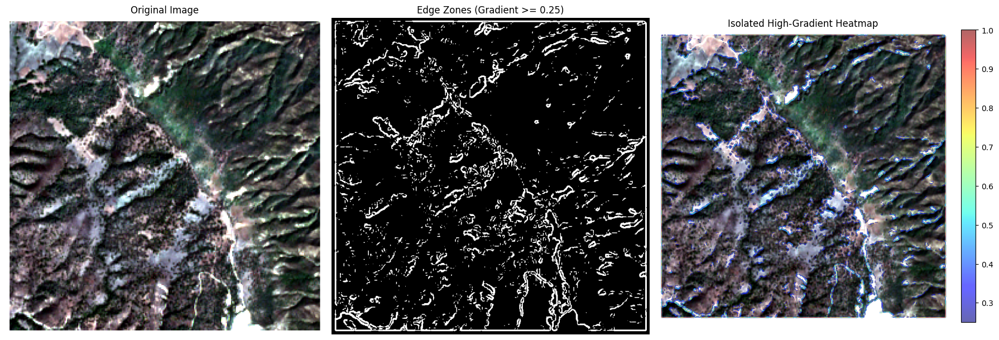

In [29]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


def plot_gradient_heatmap(
    image_path, blur_ksize=5, gradient_threshold=0.3, alpha=0.6, cmap="jet"
):
    """Computes spatial gradient magnitude using Sobel operators and overlays

    a heatmap on areas that exceed a specified magnitude threshold.

    Parameters:
    -----------
    image_path : str
        Path to the input image.
    blur_ksize : int
        Kernel size for Gaussian blur (must be odd). Blurring helps filter out
        pixel-level sensor noise so the gradient focuses on structural edges.
    gradient_threshold : float
        Value between 0.0 and 1.0. Only regions with a normalized gradient
        magnitude at or above this threshold will be highlighted.
    alpha : float
        Blending factor for the overlay.
    cmap : str
        The matplotlib colormap to use for the heatmap.
    """
    # 1. Load the original image
    bgr_img = cv2.imread(image_path)
    if bgr_img is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)

    # 2. Convert to grayscale
    gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

    # 3. Apply a slight Gaussian Blur to suppress high-frequency noise
    if blur_ksize > 1:
        gray_img = cv2.GaussianBlur(gray_img, (blur_ksize, blur_ksize), 0)

    # 4. Compute Gradients using Sobel operators (dx and dy)
    # We use cv2.CV_64F to avoid overflow errors during calculation
    sobel_x = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3)

    # Calculate total gradient magnitude: sqrt(G_x^2 + G_y^2)
    gradient_magnitude = cv2.magnitude(sobel_x, sobel_y)

    # 5. Normalize gradient magnitude to 0-1 range
    grad_min, grad_max = gradient_magnitude.min(), gradient_magnitude.max()
    if grad_max > grad_min:
        norm_gradient = (gradient_magnitude - grad_min) / (
            grad_max - grad_min
        )
    else:
        norm_gradient = np.zeros_like(gradient_magnitude, dtype=np.float32)

    # --- THRESHOLD FILTERING LOGIC ---
    thresholded_gradient = norm_gradient.copy()
    # Mask out weak gradients by setting them to NaN (making them transparent)
    thresholded_gradient[thresholded_gradient < gradient_threshold] = np.nan
    # ---------------------------------

    # 6. Plotting the results
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot 1: Original Image
    axes[0].imshow(rgb_img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Plot 2: Binary Edge Mask
    binary_mask = norm_gradient >= gradient_threshold
    axes[1].imshow(binary_mask, cmap="gray")
    axes[1].set_title(f"Edge Zones (Gradient >= {gradient_threshold})")
    axes[1].axis("off")

    # Plot 3: Gradient Heatmap Overlay
    axes[2].imshow(rgb_img)
    # Matplotlib ignores NaN values, keeping non-edge areas perfectly clear
    im2 = axes[2].imshow(thresholded_gradient, cmap=cmap, alpha=alpha)
    axes[2].set_title("Isolated High-Gradient Heatmap")
    axes[2].axis("off")
    fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


# Example Usage:
# blur_ksize=5 smoothens minor noise.
# gradient_threshold=0.25 pulls out explicit boundaries and high-frequency textures.
plot_gradient_heatmap(
    "output4.png", blur_ksize=5, gradient_threshold=0.25, alpha=0.6, cmap="jet"
)

Total 197 found.


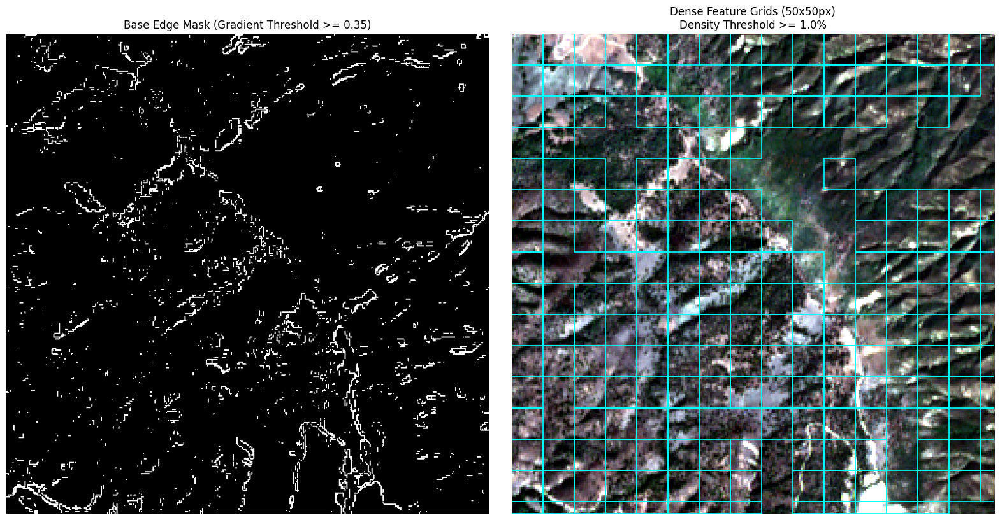

In [30]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


def plot_dense_gradient_grid(
    image_path,
    blur_ksize=5,
    gradient_threshold=0.25,
    density_threshold=0.10,
    grid_size=50,
):
    """Tiles the image into grid cells of grid_size x grid_size pixels and overlays

    a grid ONLY over regions containing a high density of significant gradients.

    Parameters:
    -----------
    image_path : str
        Path to the input image.
    blur_ksize : int
        Kernel size for Gaussian blur to suppress noise.
    gradient_threshold : float
        Value (0.0 to 1.0) to classify a pixel as a "high gradient" edge point.
    density_threshold : float
        Value (0.0 to 1.0). The minimum ratio of high-gradient pixels required
        within a 50x50 block to trigger a grid cell overlay. For example, 0.10
        means at least 10% of the pixels in the block must be edges.
    grid_size : int
        The dimension of the square grid patches in pixels (default 50).
    """
    # 1. Load the original image
    bgr_img = cv2.imread(image_path)
    if bgr_img is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")
    ignore_border_pixels = 10
    if ignore_border_pixels > 0:
        bgr_img = bgr_img[
            ignore_border_pixels:-ignore_border_pixels,
            ignore_border_pixels:-ignore_border_pixels,
        ]
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
    gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

    # 2. Apply Gaussian Blur
    if blur_ksize > 1:
        gray_img = cv2.GaussianBlur(gray_img, (blur_ksize, blur_ksize), 0)

    # 3. Compute Gradients using Sobel operators
    sobel_x = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = cv2.magnitude(sobel_x, sobel_y)

    # 4. Normalize gradient magnitude to 0-1
    grad_min, grad_max = gradient_magnitude.min(), gradient_magnitude.max()
    if grad_max > grad_min:
        norm_gradient = (gradient_magnitude - grad_min) / (
            grad_max - grad_min
        )
    else:
        norm_gradient = np.zeros_like(gradient_magnitude, dtype=np.float32)

    # Create a binary mask of pixels that meet the gradient criteria
    binary_edge_mask = norm_gradient >= gradient_threshold

    # 5. Calculate Tiled Density Grid
    height, width = gray_img.shape
    dense_grid_cells = []

    # Iterate through the image in steps of grid_size (50 pixels)
    for y in range(0, height, grid_size):
        for x in range(0, width, grid_size):
            # Define current patch boundaries (handling image borders)
            y_end = min(y + grid_size, height)
            x_end = min(x + grid_size, width)

            # Extract the patch from the binary edge mask
            patch = binary_edge_mask[y:y_end, x:x_end]

            # Calculate edge pixel density inside this specific patch
            edge_density = np.mean(patch)  # Ratio of True values to total items

            # Save the grid metadata if it passes the density cutoff threshold
            if edge_density >= density_threshold:
                dense_grid_cells.append(
                    {
                        "x": x,
                        "y": y,
                        "w": x_end - x,
                        "h": y_end - y,
                        "density": edge_density,
                    }
                )

    # 6. Plotting the results
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Plot 1: Binary Edge Mask for reference
    axes[0].imshow(binary_edge_mask, cmap="gray")
    axes[0].set_title(
        f"Base Edge Mask (Gradient Threshold >= {gradient_threshold})"
    )
    axes[0].axis("off")

    # Plot 2: Original Image with Isolated Density Grid Overlays
    axes[1].imshow(rgb_img)
    axes[1].set_title(
        f"Dense Feature Grids ({grid_size}x{grid_size}px)\n"
        f"Density Threshold >= {density_threshold * 100}%"
    )
    axes[1].axis("off")

    print(f"Total {len(dense_grid_cells)} found.")

    # Draw the filtered bounding grid blocks on top of the image
    for cell in dense_grid_cells:
        # Create a bounding box vector patch
        rect = patches.Rectangle(
            (cell["x"], cell["y"]),
            cell["w"],
            cell["h"],
            linewidth=1.2,
            edgecolor="cyan",  # Clear high-contrast color for satellite/raster backdrops
            facecolor="none",
        )
        axes[1].add_patch(rect)

    plt.tight_layout()
    plt.show()


# Example Usage:
# grid_size=50 enforces the 50x50 pixel block constraints.
# density_threshold=0.10 means a grid box displays if at least 10% of its pixels are strong edges.
plot_dense_gradient_grid(
    image_path="output4.png",
    blur_ksize=3,
    gradient_threshold=0.35,
    density_threshold=0.01,
    grid_size=50,
)

Starting grid search: 15 radii tiers x 1 alpha channels...


Collage grid layout successfully saved to entropy_grid_search2.png


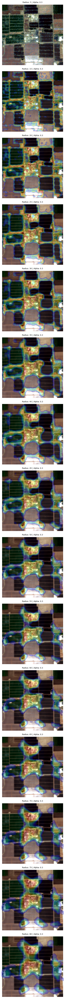

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters.rank import entropy
from skimage.morphology import disk


def grid_search_entropy_heatmap(
    image_path,
    disk_radii_list=[5, 15, 30],
    alpha_list=[0.3, 0.5, 0.7],
    entropy_threshold=0.7,
    cmap="jet",
):
    """Generates a hyperparameter comparison collage matrix plotting combinations

    of disk_radius (rows) and alpha values (columns).

    Parameters:
    -----------
    image_path : str
        Path to the input image.
    disk_radii_list : list of int
        List of different neighborhood radii to sweep through.
    alpha_list : list of float
        List of different alpha transparency limits to sweep through.
    entropy_threshold : float
        Threshold baseline for filtering out low-entropy pixels (0.0 - 1.0).
    cmap : str
        The colormap used for the heatmap array.
    """
    # 1. Base Image IO Setup
    bgr_img = cv2.imread(image_path)
    if bgr_img is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
    gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

    num_rows = len(disk_radii_list)
    num_cols = len(alpha_list)

    # Dynamic figure sizing: Scales cleanly with list lengths
    fig, axes = plt.subplots(
        num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows), squeeze=False
    )

    print(
        f"Starting grid search: {num_rows} radii tiers x {num_cols} alpha channels..."
    )

    # 2. Iterate through rows (Disk Radii)
    for r_idx, radius in enumerate(disk_radii_list):

        # OPTIMIZATION: Compute the entropy footprint matrix ONLY once per row
        footprint = disk(radius)
        entropy_map = entropy(gray_img, footprint)

        # Normalize the structural map profile
        entropy_min, entropy_max = entropy_map.min(), entropy_map.max()
        if entropy_max > entropy_min:
            norm_entropy = (entropy_map - entropy_min) / (
                entropy_max - entropy_min
            )
        else:
            norm_entropy = np.zeros_like(entropy_map, dtype=np.float32)

        # Apply spatial bounding threshold mask
        thresholded_entropy = norm_entropy.copy()
        thresholded_entropy[thresholded_entropy < entropy_threshold] = np.nan

        # 3. Iterate through columns (Alpha levels)
        for a_idx, alpha in enumerate(alpha_list):
            ax = axes[r_idx, a_idx]

            # Plot base layer
            ax.imshow(rgb_img)

            # Overlay masked texturing array using current column's alpha
            ax.imshow(thresholded_entropy, cmap=cmap, alpha=alpha)

            # Clean matrix title annotations highlighting configurations
            ax.set_title(f"Radius: {radius} | Alpha: {alpha}", fontsize=10)
            ax.axis("off")

    plt.tight_layout()

    # Optional: Save down the evaluation matrix for manual inspection
    output_grid_path = "entropy_grid_search2.png"
    plt.savefig(output_grid_path, dpi=200, bbox_inches="tight")
    print(f"Collage grid layout successfully saved to {output_grid_path}")

    plt.show()


# Example Evaluation Sweep:
grid_search_entropy_heatmap(
    image_path="output.png",
    disk_radii_list=[5, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80],  # Controls localized vs global texture scale
    alpha_list=[0.3],  # Controls backdrop visibility balance
    entropy_threshold=0.75,
)

In [1]:
import geopandas as gpd

gpd.read_file(rf"/data/susanket/queryearth/california_grid.geojson")

,FID,geometry
0,0,"POLYGON ((-13855274.7299 4922930.6171, -138572..."
1,1,"POLYGON ((-13855274.7299 4924930.6171, -138572..."
2,2,"POLYGON ((-13855274.7299 4926930.6171, -138572..."
3,3,"POLYGON ((-13855274.7299 4928930.6171, -138572..."
4,4,"POLYGON ((-13855274.7299 4930930.6171, -138572..."
...,...,...
169581,169581,"POLYGON ((-12705274.7299 4064930.6171, -127072..."
169582,169582,"POLYGON ((-12705274.7299 4066930.6171, -127072..."
169583,169583,"POLYGON ((-12705274.7299 4068930.6171, -127072..."
169584,169584,"POLYGON ((-12705274.7299 4070930.6171, -127072..."
